In [321]:
# Importing required libraries and setting plotting options.
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date
import statistics
from PIL import Image 

sns.set(rc = {'figure.figsize': (15,10)})

### GitHub repository
- [My Github Repo](https://github.com/Maduraa96/LSE_DA_COVID_analysis)

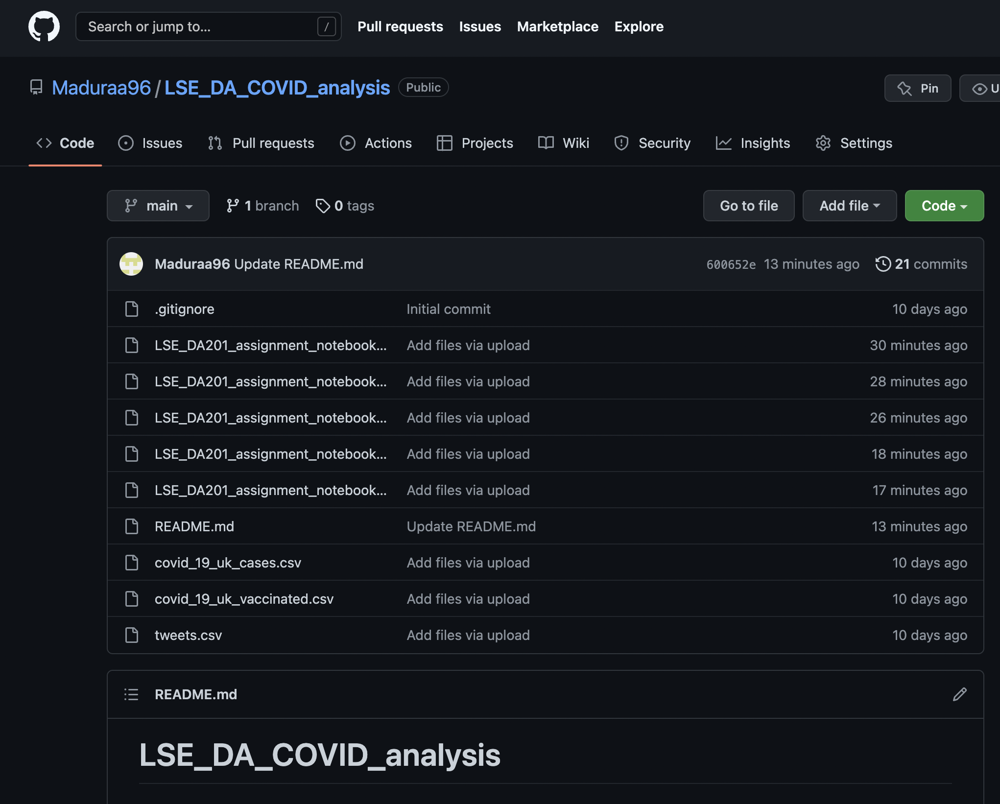

In [325]:
# Importing screenshot of my GitHub repository
GitHub_screenshot = Image.open("GitHub_repo.png")
GitHub_screenshot

GitHub is a code hosting platform for version control and collaborations [https://docs.github.com/en/get-started/quickstart/hello-world]. 

It maintains all the versions of the project starting from the initial stage all the way to the final stage. This helps the developer to keep track of his/her changes, and makes it easy to revert back to previous versions of the project should the current version be unsatisfactory (due to logical errors, etc).

By providing a repository that can be private, as well as public, means that collaboration on the project would be easier for those working on the project. 

In [326]:
# Importing necessary files onto Python for analysis purposes.
covid_cases = pd.read_csv("covid_19_uk_cases.csv")
vaccination_rates = pd.read_csv("covid_19_uk_vaccinated.csv")
tweets = pd.read_csv("tweets.csv")

## Exploring the Data

### 1. covid_cases

In [327]:
# Printing first 5 rows.
covid_cases.head()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,0.0,0.0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,0.0,0.0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,0.0,0.0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,0.0,0.0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,0.0,0.0


In [328]:
# Printing last 5 rows of data.
covid_cases.tail()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
7579,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-10,137735.0,8154306.0,0.0,378.0
7580,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-11,137763.0,8193769.0,0.0,386.0
7581,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-12,137944.0,8231437.0,0.0,386.0
7582,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-13,138080.0,8272883.0,0.0,0.0
7583,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-14,138237.0,8317439.0,0.0,0.0


In [329]:
# Determining shape, data type, and concise summary of covid_cases data set.
print(covid_cases.shape)
print(covid_cases.dtypes)
# Using info() to determine the exact columns where we have missing data.
# There are 2 rows of data missing from columns 8,9,10 and 11. 
print(covid_cases.info())

(7584, 12)
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Deaths                      float64
Cases                       float64
Recovered                   float64
Hospitalised                float64
dtype: object
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7584 entries, 0 to 7583
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes  7584 non-null   object 
 5   Sub-region Name           7584 non-null   obje

#### Observations

- Used .dtypes() as that was asked of us from the assignment. However, .info() provides the datatype of the columns within it's output (this is also true for all other parts of code where I have used both .dtypes() and .info()).

- The csv file consists of 7584 rows of data seperated into 12 columns.

- .info() shows that there's two rows of missing data in columns,'Deaths', 'Cases', 'Recovered', 'Hospitalised'.

In [330]:
# Creating a DataFrame which contains only the rows with missing data.
covid_cases_na = covid_cases[covid_cases.isna().any(axis=1)]
# Printing shape of the new dataframe, covid_cases_na.
print(covid_cases_na.shape)
# Printing the DataFrame.
covid_cases_na

(2, 12)


,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
875,Bermuda,United Kingdom,32.3078,-64.7505,BMU,Northern America,0,2020-09-21,NaN,NaN,NaN,NaN
876,Bermuda,United Kingdom,32.3078,-64.7505,BMU,Northern America,0,2020-09-22,NaN,NaN,NaN,NaN


- Validates the information gathered from .info()

### 2. vaccination_rates

In [331]:
# Printing first 5 rows of vaccination_rates data set.
vaccination_rates.head()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0,0,0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0,0,0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0,0,0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0,0,0


In [332]:
# Printing last 5 rows of vaccination_rates data set.
vaccination_rates.tail()

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
7579,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-10,1070,1216,1070
7580,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-11,1300,1604,1300
7581,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-12,1482,2027,1482
7582,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-13,0,0,0
7583,Others,United Kingdom,55.3781,-3.436,GBR,Northern Europe,0,2021-10-14,0,0,0


In [333]:
# Printing shape, data type, and concise summary of vaccination_rates data set.
print(vaccination_rates.shape)
print(vaccination_rates.dtypes)
print(vaccination_rates.info())

(7584, 11)
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Vaccinated                    int64
First Dose                    int64
Second Dose                   int64
dtype: object
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7584 entries, 0 to 7583
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float64
 4   ISO 3166-1 Alpha 3-Codes  7584 non-null   object 
 5   Sub-region Name           7584 non-null   object 
 6   Intermediate Region Code  7

#### Observations
- Consists of 7584 rows of data, split into 11 columns.
- No missing data 

In [334]:
# Number of rows with missing data.
vaccination_rates_na = vaccination_rates[vaccination_rates.isna().any(axis=1)]
# Printing the shape of vaccination_rates_na, and the vaccination_rates_na dataframe.
print(vaccination_rates_na.shape)
vaccination_rates_na

(0, 11)


,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose


## Merging and exploring data

### 1. Merging covid_cases and vaccination_rates together

In [111]:
# Merging covid_cases DataFrame and vaccination_rates DataFrame together. 
cov_vacc_merge = pd.merge(covid_cases, vaccination_rates)

In [112]:
# Printing first two rows of merged dataset to ensure that the DataFrames have been correctly merged.
cov_vacc_merge.head(2)

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,0.0,0.0,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,0.0,0.0,0,0,0


In [113]:
# Prints datatypes of the columns in merged dataset, the shape and concise info on merged dataset.
print(cov_vacc_merge.dtypes)
print(cov_vacc_merge.shape)
print(cov_vacc_merge.info())

Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Deaths                      float64
Cases                       float64
Recovered                   float64
Hospitalised                float64
Vaccinated                    int64
First Dose                    int64
Second Dose                   int64
dtype: object
(7584, 15)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7584 entries, 0 to 7583
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Province/State            7584 non-null   object 
 1   Country/Region            7584 non-null   object 
 2   Lat                       7584 non-null   float64
 3   Long                      7584 non-null   float6

In [114]:
# Converting the data type of the Date column from object to DateTime.
cov_vacc_merge['Date'] = pd.to_datetime(cov_vacc_merge['Date'])

print(cov_vacc_merge.dtypes)

Province/State                      object
Country/Region                      object
Lat                                float64
Long                               float64
ISO 3166-1 Alpha 3-Codes            object
Sub-region Name                     object
Intermediate Region Code             int64
Date                        datetime64[ns]
Deaths                             float64
Cases                              float64
Recovered                          float64
Hospitalised                       float64
Vaccinated                           int64
First Dose                           int64
Second Dose                          int64
dtype: object


In [17]:
# Dropping unnecessary columns from merged DataFrame. 
cov_vacc_drop = cov_vacc_merge.drop(columns=['Lat', 'Long', 
                                             'ISO 3166-1 Alpha 3-Codes',
                                             'Sub-region Name', 'Intermediate Region Code'])

cov_vacc_drop.head()

,Province/State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,2020-01-22,0.0,0.0,0.0,0.0,0,0,0
1,Anguilla,United Kingdom,2020-01-23,0.0,0.0,0.0,0.0,0,0,0
2,Anguilla,United Kingdom,2020-01-24,0.0,0.0,0.0,0.0,0,0,0
3,Anguilla,United Kingdom,2020-01-25,0.0,0.0,0.0,0.0,0,0,0
4,Anguilla,United Kingdom,2020-01-26,0.0,0.0,0.0,0.0,0,0,0


In [115]:
# Checking for missing datasets (there should only be 2).
covid_vacc_drop_na = cov_vacc_drop[cov_vacc_drop.isna().any(axis=1)]
# Printing the shape of vaccination_rates_na, and the vaccination_rates_na dataframe.
print(covid_vacc_drop_na.shape)
covid_vacc_drop_na

(2, 12)


,Province/State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Vaccination Difference,Month
875,Bermuda,United Kingdom,2020-09-21,NaN,NaN,NaN,NaN,0,0,0,0,2020/09
876,Bermuda,United Kingdom,2020-09-22,NaN,NaN,NaN,NaN,0,0,0,0,2020/09


### 2. Analysing merged datasets

In [117]:
# Initial analysis of the data to get insight into trends that can be explored.

In [126]:
# Grouping data in merged dataset by Province/State.
per_region = cov_vacc_drop.groupby('Province/State')

# Finding the total number of cases per Province/State.
# .apply(lambda) allows the expression to be applied to every row split by Province/State.
cases = per_region.apply(lambda x: x[x['Country/Region']=='United Kingdom']['Cases'].sum())
# Sorting the total from highest to lowest cases.
cases.sort_values(ascending=False)

Province/State
Others                                          1.621651e+09
Channel Islands                                 1.957978e+06
Gibraltar                                       1.413853e+06
Isle of Man                                     8.871330e+05
Turks and Caicos Islands                        7.526180e+05
Bermuda                                         6.854420e+05
British Virgin Islands                          2.849610e+05
Cayman Islands                                  2.177560e+05
Anguilla                                        3.531500e+04
Falkland Islands (Malvinas)                     2.048200e+04
Montserrat                                      9.556000e+03
Saint Helena, Ascension and Tristan da Cunha    1.438000e+03
dtype: float64

#### Observations
- Top 3 highest recorded for cases (ignoring 'Others' as I have identified it to be an outlier later on): 
    - Channel Islands
    - Gibraltar
    - Isle of Man

In [127]:
# Sum of deaths per Province/State sorted from highest to lowest.
deaths = per_region.apply(lambda x: x[x['Country/Region']=='United Kingdom']['Deaths'].sum())

deaths.sort_values(ascending=False)

Province/State
Others                                          46987145.0
Channel Islands                                    37130.0
Gibraltar                                          25412.0
Isle of Man                                        15051.0
Bermuda                                            10353.0
Turks and Caicos Islands                            5612.0
British Virgin Islands                              3573.0
Cayman Islands                                       911.0
Montserrat                                           539.0
Anguilla                                              24.0
Saint Helena, Ascension and Tristan da Cunha           4.0
Falkland Islands (Malvinas)                            0.0
dtype: float64

#### Observations
- Top 3 highest for sum of death:
    - Channel Islands
    - Gibraltar
    - Isle of Man

In [128]:
# Sum of recoveries per Province/State sorted from highest to lowest.
recovered = per_region.apply(lambda x: x[x['Country/Region']=='United Kingdom']['Recovered'].sum())

recovered.sort_values(ascending=False)

Province/State
Channel Islands                                 1027626.0
Gibraltar                                        956103.0
Turks and Caicos Islands                         515923.0
Bermuda                                          363999.0
Isle of Man                                      328319.0
Cayman Islands                                   152052.0
British Virgin Islands                            64359.0
Falkland Islands (Malvinas)                       14754.0
Anguilla                                          12708.0
Montserrat                                         6376.0
Others                                             4115.0
Saint Helena, Ascension and Tristan da Cunha       1135.0
dtype: float64

#### Observations
- Top 3 with highest recoveries:
    - Channel Islands
    - Gibraltar
    - Turks and Caicos Islands

In [129]:
# Sum of first doses per region sorted from highest to lowest.
first_dose = per_region.apply(lambda x: x[x['Country/Region']=='United Kingdom']['First Dose'].sum())

first_dose.sort_values(ascending=False)

Province/State
Gibraltar                                       5870786
Montserrat                                      5401128
British Virgin Islands                          5166303
Anguilla                                        4931470
Isle of Man                                     4226984
Falkland Islands (Malvinas)                     3757307
Cayman Islands                                  3522476
Channel Islands                                 3287646
Turks and Caicos Islands                        3052822
Bermuda                                         2817981
Others                                          2583151
Saint Helena, Ascension and Tristan da Cunha    2348310
dtype: int64

#### Observations
- Top 3 with highest number of first doses:
    - Gibraltar
    - Montserrat
    - British Virgin Islands

In [130]:
# Sum of second doses per region sorted from highest to lowest.
second_dose = per_region.apply(lambda x: x[x['Country/Region']=='United Kingdom']['Vaccinated'].sum())

second_dose.sort_values(ascending=False)

Province/State
Gibraltar                                       5606041
Montserrat                                      5157560
British Virgin Islands                          4933315
Anguilla                                        4709072
Isle of Man                                     4036345
Falkland Islands (Malvinas)                     3587869
Cayman Islands                                  3363624
Channel Islands                                 3139385
Turks and Caicos Islands                        2915136
Bermuda                                         2690908
Others                                          2466669
Saint Helena, Ascension and Tristan da Cunha    2242421
dtype: int64

#### Observations
- Top 3 with highest number of second doses:
    - Gibraltar
    - Montserrat
    - British Virgin Islands

In [131]:
# Creating column which showcases the number of people who have taken their first dose but not their second dose.
cov_vacc_drop['Vaccination Difference'] = cov_vacc_drop['First Dose'] - cov_vacc_drop['Second Dose']

cov_vacc_drop.tail()

,Province/State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Vaccination Difference,Month
7579,Others,United Kingdom,2021-10-10,137735.0,8154306.0,0.0,378.0,1070,1216,1070,146,2021/10
7580,Others,United Kingdom,2021-10-11,137763.0,8193769.0,0.0,386.0,1300,1604,1300,304,2021/10
7581,Others,United Kingdom,2021-10-12,137944.0,8231437.0,0.0,386.0,1482,2027,1482,545,2021/10
7582,Others,United Kingdom,2021-10-13,138080.0,8272883.0,0.0,0.0,0,0,0,0,2021/10
7583,Others,United Kingdom,2021-10-14,138237.0,8317439.0,0.0,0.0,0,0,0,0,2021/10


In [133]:
# Updating the previous set of code with the new set of data that contains the newly added columns.
per_region = cov_vacc_drop.groupby('Province/State')

# Displaying the total number of people who have had first doses but not second doses in each region.
Difference = per_region.apply(lambda x: x[x['Country/Region']=='United Kingdom']['Vaccination Difference'].sum())

Difference.sort_values(ascending=False)

Province/State
Gibraltar                                       264745
Montserrat                                      243568
British Virgin Islands                          232988
Anguilla                                        222398
Isle of Man                                     190639
Falkland Islands (Malvinas)                     169438
Cayman Islands                                  158852
Channel Islands                                 148261
Turks and Caicos Islands                        137686
Bermuda                                         127073
Others                                          116482
Saint Helena, Ascension and Tristan da Cunha    105889
dtype: int64

#### Observations
- Top 3 countries with Vaccination Difference (highest difference between those who have taken their first dose vs second dose):
    - Gibraltar
    - Montserrat
    - British Virgin Islands

## Gibraltar analysis

In [134]:
# Allows all the rows to be printed if whole DataFrame needs to be displayed.
pd.set_option("display.max_rows", None)

In [230]:
# Filtering out only the rows that contain Gibraltar from the cov_vacc_drop DataFrame.
Gibraltar = cov_vacc_drop[cov_vacc_drop['Province/State']=='Gibraltar']

print(Gibraltar.shape)
Gibraltar

(632, 12)


,Province/State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Vaccination Difference,Month
3792,Gibraltar,United Kingdom,2020-01-22,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3793,Gibraltar,United Kingdom,2020-01-23,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3794,Gibraltar,United Kingdom,2020-01-24,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3795,Gibraltar,United Kingdom,2020-01-25,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3796,Gibraltar,United Kingdom,2020-01-26,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3797,Gibraltar,United Kingdom,2020-01-27,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3798,Gibraltar,United Kingdom,2020-01-28,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3799,Gibraltar,United Kingdom,2020-01-29,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3800,Gibraltar,United Kingdom,2020-01-30,0.0,0.0,0.0,0.0,0,0,0,0,2020/01
3801,Gibraltar,United Kingdom,2020-01-31,0.0,0.0,0.0,0.0,0,0,0,0,2020/01


In [229]:
# New DataFrame which shows instances where the number of cases is less than those who are hospitalised with Covid.
Cases_v_Hospitalised = Gibraltar[Gibraltar['Cases'] < Gibraltar['Hospitalised']]

print(Cases_v_Hospitalised.shape)
Cases_v_Hospitalised.head()

(236, 12)


,Province/State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Vaccination Difference,Month
3857,Gibraltar,United Kingdom,2020-03-27,0.0,55.0,14.0,908.0,0,0,0,0,2020/03
3858,Gibraltar,United Kingdom,2020-03-28,0.0,56.0,14.0,1035.0,0,0,0,0,2020/03
3859,Gibraltar,United Kingdom,2020-03-29,0.0,65.0,14.0,1191.0,0,0,0,0,2020/03
3860,Gibraltar,United Kingdom,2020-03-30,0.0,69.0,34.0,1387.0,0,0,0,0,2020/03
3861,Gibraltar,United Kingdom,2020-03-31,0.0,69.0,34.0,1575.0,0,0,0,0,2020/03


#### Observations
- There is 236/632 rows which shows Covid Cases being less than the number of people who are hospitalised with Covid. This shows some form of inaccurate information. 
- One hypothesis is Hospitalised data is cumulative, but looking at the data that precedes row 3857, it is evident that 908 hospitalised cases does not make sense, as the cumulative number for cases up until 3857 does not reach that amount.
- However this could be a result of reporting error as it was common, especially at the beginning when there wasn't enough PPE kits for everyone to get tested, and covid cases were going unreported, and data wasn't being recorded properly.
- For example, on 5th October 2020 16,000 coronavirus cases were missed in daily figures after IT error (source: https://www.bbc.co.uk/news/uk-54412581 - BBC News Article)

In [221]:
# Subsetting Gibraltar DataFrame to consist of only 'Deaths', 'Cases', 'Recovered', and 'Hospitalised' columns.
Gibraltar_new = Gibraltar.drop(columns=['Province/State', 'Country/Region', 
                                        'Date', 'Vaccinated',
                                        'First Dose', 'Second Dose', 
                                        'Vaccination Difference', 'Month'])

Gibraltar_new.tail()

,Deaths,Cases,Recovered,Hospitalised
4419,97.0,5626.0,0.0,858.0
4420,97.0,5655.0,0.0,876.0
4421,97.0,5682.0,0.0,876.0
4422,97.0,5707.0,0.0,0.0
4423,97.0,5727.0,0.0,0.0


In [222]:
# Generates descriptive statistics for the Gibraltar_new data set. 
Gibraltar_new.describe()

,Deaths,Cases,Recovered,Hospitalised
count,632.000000,632.000000,632.000000,632.000000
mean,40.208861,2237.109177,1512.821203,1027.625000
std,45.332832,2136.268090,1817.096755,1145.681058
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,177.000000,109.500000,157.750000
50%,5.000000,1036.500000,323.500000,675.500000
75%,94.000000,4286.000000,4122.500000,1548.000000
max,97.000000,5727.000000,4670.000000,4907.000000


In [233]:
# Printing the mode of the data in each column.
Gibraltar_new.mode()

,Deaths,Cases,Recovered,Hospitalised
0,0.0,0.0,0.0,0.0


#### Observations
- Deaths: Mode < Median < Mean, so data for Deaths is positively skewed.
- Cases: Mode < Median < Mean, so data for Cases is positively skewed.
- Recovered: Mode < Median < Mean, so data for Recovered is positively skewed.
- Hospitalised: Mode < Median < Mean, so data for Hospitalised cases is positively skewed. 

Positively skewed data means that outliers exist further out towards the right hand side of the data (when pictured as a bell shaped curve).

## Visualising and identifying initial trends

In [237]:
"""
Using groupby and aggregate functions to calculate differences between the application of the first and second dose.

Initially creating a DataFrame consisting of:
    - the sum of first dose per Province/State in column labelled 'First Dose'.
    - the sum of second dose per Province/State in column labelled 'Second Dose'.
"""
vaccination_group = cov_vacc_merge.groupby('Province/State').agg({'First Dose':'sum', 'Second Dose':'sum'})

# Different column to Province/State used as index.
vaccination_group = vaccination_group.reset_index()
vaccination_group

,Province/State,First Dose,Second Dose
0,Anguilla,4931470,4709072
1,Bermuda,2817981,2690908
2,British Virgin Islands,5166303,4933315
3,Cayman Islands,3522476,3363624
4,Channel Islands,3287646,3139385
5,Falkland Islands (Malvinas),3757307,3587869
6,Gibraltar,5870786,5606041
7,Isle of Man,4226984,4036345
8,Montserrat,5401128,5157560
9,Others,2583151,2466669


In [238]:
# Creating a new column in vaccination_group DataFrame.
# New column calculates the number of people who have had their first dose but not their second dose.
vaccination_group['Difference'] = vaccination_group['First Dose'] - vaccination_group['Second Dose']
vaccination_group

,Province/State,First Dose,Second Dose,Difference
0,Anguilla,4931470,4709072,222398
1,Bermuda,2817981,2690908,127073
2,British Virgin Islands,5166303,4933315,232988
3,Cayman Islands,3522476,3363624,158852
4,Channel Islands,3287646,3139385,148261
5,Falkland Islands (Malvinas),3757307,3587869,169438
6,Gibraltar,5870786,5606041,264745
7,Isle of Man,4226984,4036345,190639
8,Montserrat,5401128,5157560,243568
9,Others,2583151,2466669,116482


In [239]:
# Creating new column, 'Ratio of interest', to calculate the number of individuals eligible for the second dose.
vaccination_group['Ratio of interest'] = vaccination_group['Difference']/vaccination_group['First Dose']

vaccination_group

,Province/State,First Dose,Second Dose,Difference,Ratio of interest
0,Anguilla,4931470,4709072,222398,0.045098
1,Bermuda,2817981,2690908,127073,0.045094
2,British Virgin Islands,5166303,4933315,232988,0.045098
3,Cayman Islands,3522476,3363624,158852,0.045097
4,Channel Islands,3287646,3139385,148261,0.045096
5,Falkland Islands (Malvinas),3757307,3587869,169438,0.045096
6,Gibraltar,5870786,5606041,264745,0.045095
7,Isle of Man,4226984,4036345,190639,0.045100
8,Montserrat,5401128,5157560,243568,0.045096
9,Others,2583151,2466669,116482,0.045093


#### Observations
- Every Province/State is shown to have the same proportion of people eligible for the second dose.
- So this shows that in every Province/State the same proportion of people are still not fully vaccinated, out of all the people who have had their first doses.
- Questions to consider:
    - Why is it a similar proportion for every Province/State?
        - Is it because a large number of people are still not elligible to take the second dose?
        - Was there a spread of vaccine misinformation that caused a lot of people to opt out of taking the second dose? Is there a belief that one dose is more than enough to provide immunity?
        - Are people getting more relaxed as covid restrictions ease and things are slowly getting back to normal? Is that causing people to become more 'lazy' with vaccinating themselves?
        - AstraZeneca was the used the most by UK citizens at the beginning, which led to controversies pertaining to the safety of the vaccines - did this cause people to not have their Second Dose?

In [240]:
# Displaying Ratio of interest as a percentage.
vaccination_group['Ratio of interest percentage'] = vaccination_group['Ratio of interest'].astype(float).map("{:.2%}".format)

vaccination_group

,Province/State,First Dose,Second Dose,Difference,Ratio of interest,Ratio of interest percentage
0,Anguilla,4931470,4709072,222398,0.045098,4.51%
1,Bermuda,2817981,2690908,127073,0.045094,4.51%
2,British Virgin Islands,5166303,4933315,232988,0.045098,4.51%
3,Cayman Islands,3522476,3363624,158852,0.045097,4.51%
4,Channel Islands,3287646,3139385,148261,0.045096,4.51%
5,Falkland Islands (Malvinas),3757307,3587869,169438,0.045096,4.51%
6,Gibraltar,5870786,5606041,264745,0.045095,4.51%
7,Isle of Man,4226984,4036345,190639,0.045100,4.51%
8,Montserrat,5401128,5157560,243568,0.045096,4.51%
9,Others,2583151,2466669,116482,0.045093,4.51%


In [241]:
# First Percentage column displays the percentage of people who have received their second dose over the first dose.
vaccination_group['First Percentage'] = vaccination_group['Second Dose']/vaccination_group['First Dose']
vaccination_group['First Percentage'] = vaccination_group['First Percentage'].astype(float).map("{:.2%}".format)

vaccination_group

,Province/State,First Dose,Second Dose,Difference,Ratio of interest,Ratio of interest percentage,First Percentage
0,Anguilla,4931470,4709072,222398,0.045098,4.51%,95.49%
1,Bermuda,2817981,2690908,127073,0.045094,4.51%,95.49%
2,British Virgin Islands,5166303,4933315,232988,0.045098,4.51%,95.49%
3,Cayman Islands,3522476,3363624,158852,0.045097,4.51%,95.49%
4,Channel Islands,3287646,3139385,148261,0.045096,4.51%,95.49%
5,Falkland Islands (Malvinas),3757307,3587869,169438,0.045096,4.51%,95.49%
6,Gibraltar,5870786,5606041,264745,0.045095,4.51%,95.49%
7,Isle of Man,4226984,4036345,190639,0.045100,4.51%,95.49%
8,Montserrat,5401128,5157560,243568,0.045096,4.51%,95.49%
9,Others,2583151,2466669,116482,0.045093,4.51%,95.49%


#### Observations
- 95% of the people who took the first dose also took the second dose.
- Only 5% of the people who took the first dose didn't take the second dose.

[Text(0, 0, 'Anguilla'),
 Text(1, 0, 'Bermuda'),
 Text(2, 0, 'British Virgin Islands'),
 Text(3, 0, 'Cayman Islands'),
 Text(4, 0, 'Channel Islands'),
 Text(5, 0, 'Falkland Islands (Malvinas)'),
 Text(6, 0, 'Gibraltar'),
 Text(7, 0, 'Isle of Man'),
 Text(8, 0, 'Montserrat'),
 Text(9, 0, 'Others'),
 Text(10, 0, 'Saint Helena, Ascension and Tristan da Cunha'),
 Text(11, 0, 'Turks and Caicos Islands')]

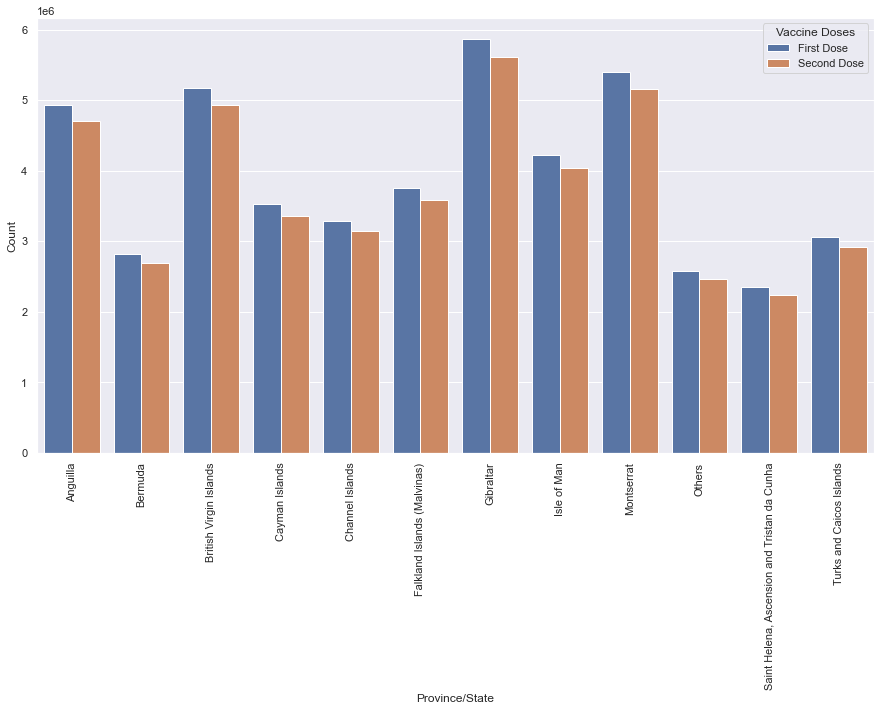

In [242]:
"""
Creating vertical bar graph to display the sum of people who had their first does, and also the number of people who 
have had their second doses.
"""
vaccine = pd.melt(vaccination_group, 
                         id_vars=['Province/State'], 
                         value_vars=['First Dose', 'Second Dose'])

vaccine.rename(columns={'variable':'Vaccine Doses', 'value':'Count'}, inplace=True)
plt.figure(figsize=(15,8))

vacc_ax=sns.barplot(x='Province/State', y='Count', hue='Vaccine Doses', data=vaccine, ci=None)
vacc_ax.set_xticklabels(vacc_ax.get_xticklabels(), rotation=90)

#### Observations
- Gibraltar has the highest number of people taking both first dose, and second dose. This goes in line with earlier discovery in Analysing merged data section.

[Text(0, 0, 'Anguilla'),
 Text(1, 0, 'Bermuda'),
 Text(2, 0, 'British Virgin Islands'),
 Text(3, 0, 'Cayman Islands'),
 Text(4, 0, 'Channel Islands'),
 Text(5, 0, 'Falkland Islands (Malvinas)'),
 Text(6, 0, 'Gibraltar'),
 Text(7, 0, 'Isle of Man'),
 Text(8, 0, 'Montserrat'),
 Text(9, 0, 'Saint Helena, Ascension and Tristan da Cunha'),
 Text(10, 0, 'Turks and Caicos Islands'),
 Text(11, 0, 'Others')]

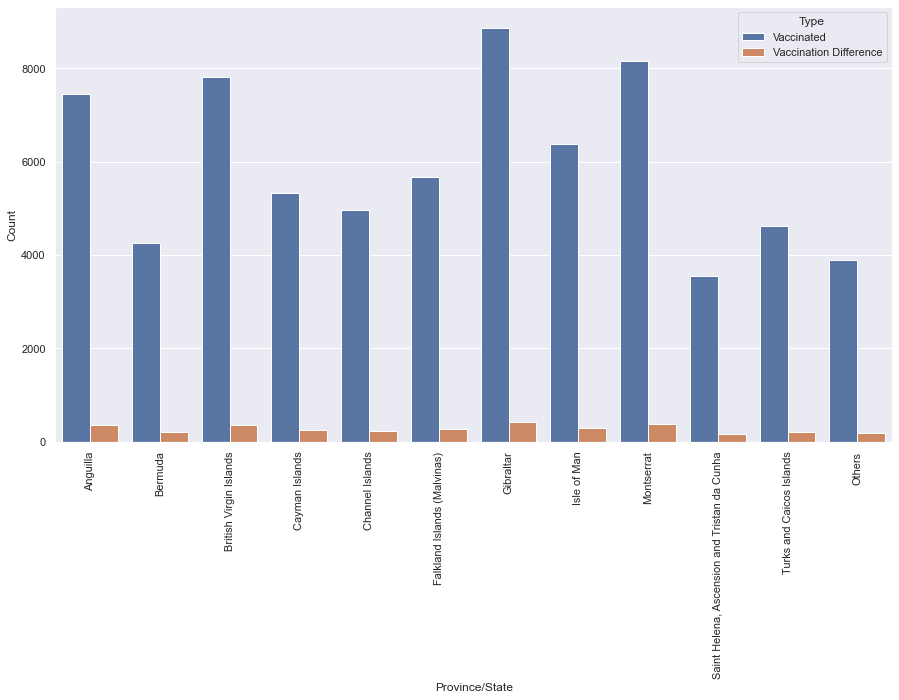

In [243]:
"""
Plotting a vertical bar graph to display the percentage for the fully vaccinated and vaccination difference.
"""
vacc_graph= pd.melt(cov_vacc_drop, 
                         id_vars=['Province/State', 'Country/Region', 'Date'], 
                         value_vars=['Vaccinated', 'Vaccination Difference'])

vacc_graph.rename(columns={'variable':'Type', 'value':'Count'}, inplace=True)
plt.figure(figsize=(15,8))

vacc_ax=sns.barplot(x='Province/State', y='Count', hue='Type', data=vacc_graph, ci=None)
vacc_ax.set_xticklabels(vacc_ax.get_xticklabels(), rotation=90)

#### Observations
- Gibraltar has the highest count for Vaccination Difference, which is expected as there is a higher number of people who took First Dose compared with other Provinces/States. Followed by Montserrat.

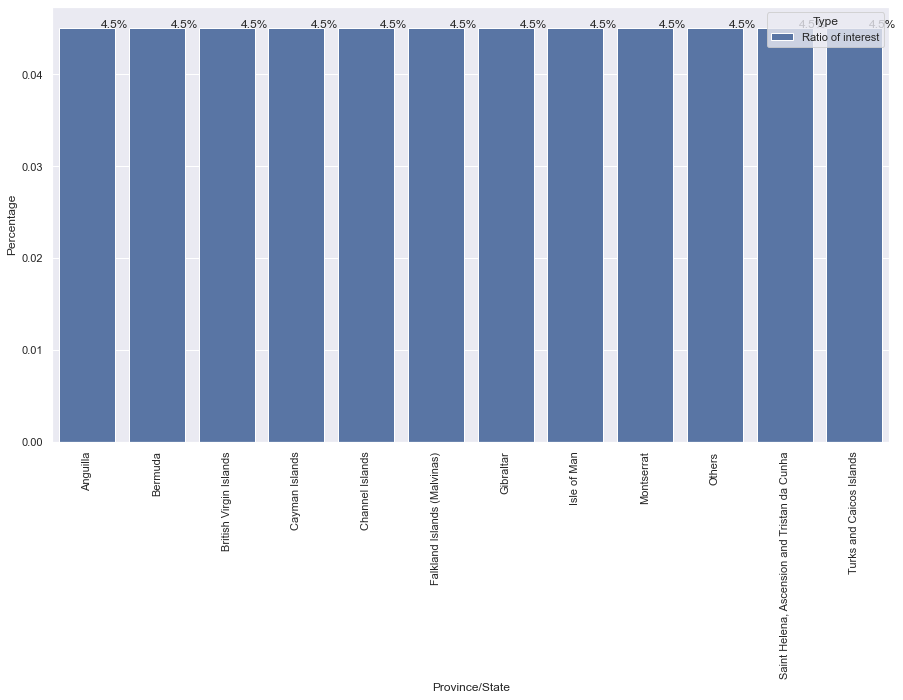

In [244]:
"""
Creating a vertical bar graph to display the percentage for the first dose to fully dosed individuals.
"""
Ratio_interest = pd.melt(vaccination_group, 
                         id_vars=['Province/State'], 
                         value_vars=['Ratio of interest'])

Ratio_interest.rename(columns={'variable':'Type','value':'Percentage'}, inplace=True)
plt.figure(figsize=(15,8))

vacc_ax=sns.barplot(x='Province/State', y='Percentage', hue='Type', data=Ratio_interest, ci=None)
vacc_ax.set_xticklabels(vacc_ax.get_xticklabels(), rotation=90)

# This is to show the value of the percentage on the bar chart.
for a in vacc_ax.patches:
    percentage = '{:.1f}%'.format(100 * a.get_height())
    x = a.get_x() + a.get_width()
    y = a.get_height()
    vacc_ax.annotate(percentage,(x,y), ha='center')
plt.show()

### Deaths dataset

In [62]:
# Splits the dates into Months and Year. 
# This makes it easier to analyse the Data - as it shows combines general information relating to each Month.
cov_vacc_drop['Month'] = pd.to_datetime(cov_vacc_drop['Date']).dt.strftime('%Y/%m')

# Creating a new DataFrame, in case old DataFrame is still necessary.
# Checking to see if a new column has been inputted.
cov_vacc_merge2 = cov_vacc_drop.rename(columns={'Province/State': 'Province_or_State'})
cov_vacc_merge2.tail()

,Province_or_State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Vaccination Difference,Month
7579,Others,United Kingdom,2021-10-10,137735.0,8154306.0,0.0,378.0,1070,1216,1070,146,2021/10
7580,Others,United Kingdom,2021-10-11,137763.0,8193769.0,0.0,386.0,1300,1604,1300,304,2021/10
7581,Others,United Kingdom,2021-10-12,137944.0,8231437.0,0.0,386.0,1482,2027,1482,545,2021/10
7582,Others,United Kingdom,2021-10-13,138080.0,8272883.0,0.0,0.0,0,0,0,0,2021/10
7583,Others,United Kingdom,2021-10-14,138237.0,8317439.0,0.0,0.0,0,0,0,0,2021/10


In [245]:
# Grouping data by Province/State, and Date, and aggregating the death.
Deaths = cov_vacc_merge2.groupby(['Province_or_State', 'Month']).agg({'Deaths': ['sum']})

Deaths2 = pd.DataFrame(Deaths)
Deaths2

Deaths
                                                            sum
Province_or_State                            Month             
Anguilla                                     2020/01        0.0
                                             2020/02        0.0
                                             2020/03        0.0
                                             2020/04        0.0
                                             2020/05        0.0
                                             2020/06        0.0
                                             2020/07        0.0
                                             2020/08        0.0
                                             2020/09        0.0
                                             2020/10        0.0
                                             2020/11        0.0
                                             2020/12        0.0
                                             2021/01        0.0
                                             2021/02        0.0
                                             2021/03        0.0
                                             2021/04        0.0
                                             2021/05        0.0
                                             2021/06        0.0
                                             2021/07        0.0
                                             2021/08        0.0
                                             2021/09       10.0
                                             2021/10       14.0
Bermuda                                      2020/01        0.0
                                             2020/02        0.0
                                             2020/03        0.0
                                             2020/04      117.0
                                             2020/05      255.0
                                             2020/06      270.0
                                             2020/07      279.0
                                             2020/08      279.0
                                             2020/09      252.0
                                             2020/10      279.0
                                             2020/11      270.0
                                             2020/12      285.0
                                             2021/01      361.0
                                             2021/02      336.0
                                             2021/03      372.0
                                             2021/04      542.0
                                             2021/05      965.0
                                             2021/06      990.0
                                             2021/07     1023.0
                                             2021/08     1024.0
                                             2021/09     1259.0
                                             2021/10     1195.0
British Virgin Islands                       2020/01        0.0
                                             2020/02        0.0
                                             2020/03        0.0
                                             2020/04       12.0
                                             2020/05       31.0
                                             2020/06       30.0
                                             2020/07       31.0
                                             2020/08       31.0
                                             2020/09       30.0
                                             2020/10       31.0
                                             2020/11       30.0
                                             2020/12       31.0
                                             2021/01       31.0
                                             2021/02       28.0
                                             2021/03       31.0
                                             2021/04       30.0
                         

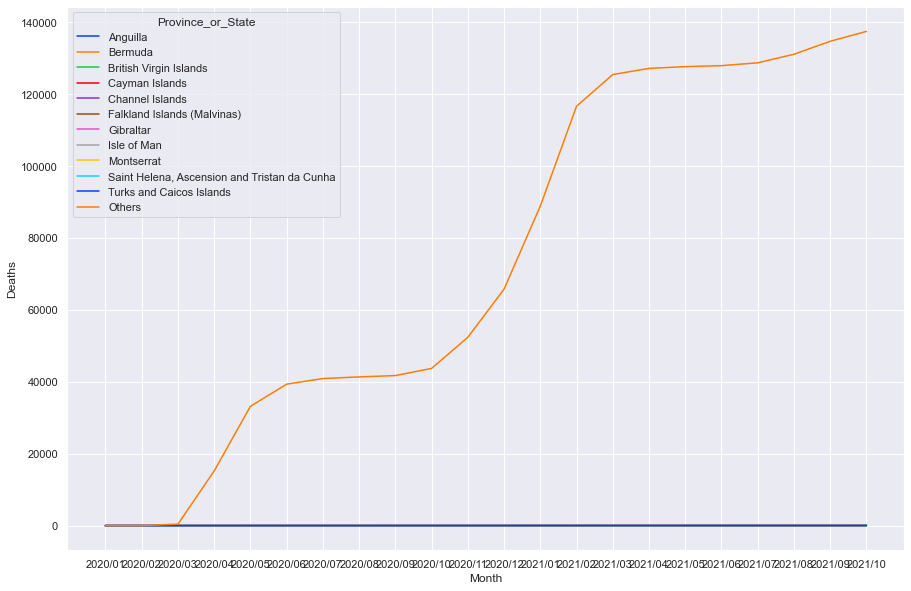

In [246]:
# Creating lineplot to display the trend of deaths across all regions over time.
# Changing column name to 'Province_or_State' as the older version causes issues because of the use of '/'.
new_df2 = cov_vacc_merge2[['Province_or_State','Month', 'Deaths']].copy()
sns.lineplot(x='Month', y='Deaths', data=new_df2, hue='Province_or_State', ci=None, palette='bright')
sns.set(rc={'figure.figsize':(20,8)})

#### Observations
- The lineplot only shows data pertaining to 'Others'. This is a result of the Deaths in Others being comparatively larger than in other Provinces/States.

In [247]:
# Creating a new DataFrame that disposes of all the rows where Province_or_State = 'Others'
new_df = cov_vacc_merge2[['Province_or_State','Month', 'Deaths']].copy()
new_df = new_df.loc[new_df["Province_or_State"]!='Others' ]

new_df

,Province_or_State,Month,Deaths
0,Anguilla,2020/01,0.0
1,Anguilla,2020/01,0.0
2,Anguilla,2020/01,0.0
3,Anguilla,2020/01,0.0
4,Anguilla,2020/01,0.0
5,Anguilla,2020/01,0.0
6,Anguilla,2020/01,0.0
7,Anguilla,2020/01,0.0
8,Anguilla,2020/01,0.0
9,Anguilla,2020/01,0.0


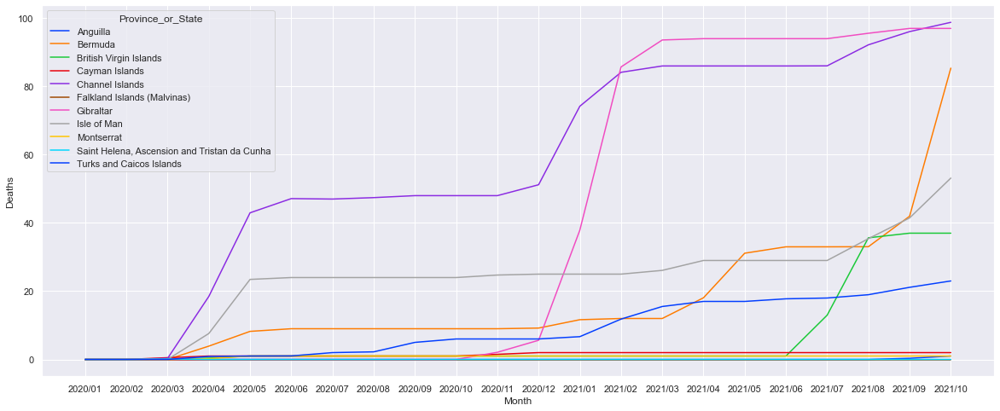

In [92]:
# Re-creating the lineplot to display the trend of deaths across all regions over time.
sns.lineplot(x='Month', y='Deaths', data=new_df, hue='Province_or_State', ci=None, palette='bright')
sns.set(rc={'figure.figsize':(20,8)})

#### Observations
- Channel Islands: 
    - This has the highest number of Deaths on 2021/10, compared to all other Provinces/States. 
    - It's highest rate of increase in Deaths is between the Months, 2020/03 and 2020/05, and it's second highest rate of increase is between 2020/12 and 2021/01.
    - As of 2021/07, the rate of Deaths seems to be rising, but a more steadier rate than previously shown. 
    - The first vaccine taken in the UK was on 08/12/2020 [source: https://www.gov.uk/government/news/uk-marks-one-year-since-deploying-worlds-first-covid-19-vaccine#:~:text=On%208%20December%202020%2C%2090,administered%20by%20Matron%20May%20Parsons.]. This could potentially explain the reduction in rate of increase in deaths from 2021/02 to 2021/06.
    - The smaller peak beginning in 2021/07 could be explained by the colder weather during winter. [source: https://www.horizonhealthnews.com/why-do-viruses-spread-more-in-winter-cold-temps-are-key/#:~:text=For%20many%2C%20cold%20weather%20just,the%20highly%20transmissible%20variant%2C%20Omicron.]
- Gibraltar: 
    - This has the steepest rate of increase in Deaths compared with the other Provinces/States. It starts in 2020/12, and ends in 2021/02.
    - The rate of increase in Deaths then slows down and becomes more stable in 2021/03. Any fluctuations that occur since that date are very minor.
    - Covid cases were rising a concerning amount in Gibraltar in early December, causing curfews to be put into place on 18/12/2020. The first vaccination in Gibraltar was given on 10/01/2021. [https://en.wikipedia.org/wiki/COVID-19_pandemic_in_Gibraltar]. 
    - Globally Covid cases were rising in 2020.12 [Source: https://www.who.int/publications/m/item/weekly-epidemiological-update---22-december-2020].

### Outlier calculations for Deaths per Province/State

#### Aim: To find outliers in Deaths column  

In [262]:
# Calculates quartiles per Province_or_State.
quartile = cov_vacc_merge2.groupby(["Province_or_State"])["Deaths"].quantile([0.25,0.75])

# Splits the lower quartile and the upper quartile into different columns.
quartile = quartile.unstack().reset_index()

# Renaming upper and lower quartile as "Q3" and "Q1"
quartile.columns = ["Province_or_State", "Q1", "Q3"]

quartile

,Province_or_State,Q1,Q3
0,Anguilla,0.00,0.00
1,Bermuda,9.00,30.75
2,British Virgin Islands,1.00,1.00
3,Cayman Islands,1.00,2.00
4,Channel Islands,47.00,86.00
5,Falkland Islands (Malvinas),0.00,0.00
6,Gibraltar,0.00,94.00
7,Isle of Man,24.00,29.00
8,Montserrat,1.00,1.00
9,Others,40312.25,127606.00


In [275]:
# Calculating IQR.
quartile['IQR'] = quartile['Q3'] - quartile['Q1'] 

# Calculating the boundary below which the data becomes an outlier (as per formula given in the first term course).
quartile['lower_outlier'] = quartile['Q1'] - 1.5*quartile['IQR']

# Calculating the boundary above which the data becomes an outlier.
quartile['upper_outlier'] = quartile['Q3'] + 1.5*quartile['IQR']

quartile

,Province_or_State,Q1,Q3,IQR,lower_outlier,upper_outlier
0,Anguilla,0.00,0.00,0.00,0.000,0.000
1,Bermuda,9.00,30.75,21.75,-23.625,63.375
2,British Virgin Islands,1.00,1.00,0.00,1.000,1.000
3,Cayman Islands,1.00,2.00,1.00,-0.500,3.500
4,Channel Islands,47.00,86.00,39.00,-11.500,144.500
5,Falkland Islands (Malvinas),0.00,0.00,0.00,0.000,0.000
6,Gibraltar,0.00,94.00,94.00,-141.000,235.000
7,Isle of Man,24.00,29.00,5.00,16.500,36.500
8,Montserrat,1.00,1.00,0.00,1.000,1.000
9,Others,40312.25,127606.00,87293.75,-90628.375,258546.625


In [280]:
# Merging data with cov_vacc_merge2, so that the lower_outlier and upper_outlier can be compared to Deaths data.
quartile_calc = pd.merge(cov_vacc_merge2, quartile, on="Province_or_State", how="left")
quartile_calc.tail()

,Province_or_State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Vaccination Difference,Month,Q1,Q3,IQR,lower_outlier,upper_outlier
7579,Others,United Kingdom,2021-10-10,137735.0,8154306.0,0.0,378.0,1070,1216,1070,146,2021/10,40312.25,127606.0,87293.75,-90628.375,258546.625
7580,Others,United Kingdom,2021-10-11,137763.0,8193769.0,0.0,386.0,1300,1604,1300,304,2021/10,40312.25,127606.0,87293.75,-90628.375,258546.625
7581,Others,United Kingdom,2021-10-12,137944.0,8231437.0,0.0,386.0,1482,2027,1482,545,2021/10,40312.25,127606.0,87293.75,-90628.375,258546.625
7582,Others,United Kingdom,2021-10-13,138080.0,8272883.0,0.0,0.0,0,0,0,0,2021/10,40312.25,127606.0,87293.75,-90628.375,258546.625
7583,Others,United Kingdom,2021-10-14,138237.0,8317439.0,0.0,0.0,0,0,0,0,2021/10,40312.25,127606.0,87293.75,-90628.375,258546.625


In [285]:
# .between function uses Boolean datatype.
# The code below displays "True" for any value that falls outside the given range, and "False" for any that falls in.
quartile_calc["Outlier"] = ~quartile_calc["Deaths"].between(quartile_calc["lower_outlier"], quartile_calc["upper_outlier"])
quartile_calc.head(2)

,Province_or_State,Country/Region,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose,Vaccination Difference,Month,Q1,Q3,IQR,lower_outlier,upper_outlier,Outlier
0,Anguilla,United Kingdom,2020-01-22,0.0,0.0,0.0,0.0,0,0,0,0,2020/01,0.0,0.0,0.0,0.0,0.0,False
1,Anguilla,United Kingdom,2020-01-23,0.0,0.0,0.0,0.0,0,0,0,0,2020/01,0.0,0.0,0.0,0.0,0.0,False


In [288]:
# Displays the number of Outliers in each Province_or_State.
outlier = quartile_calc.groupby("Province_or_State")["Outlier"].sum().astype(int).reset_index()

outlier_df = pd.DataFrame(outlier)
outlier_df

,Province_or_State,Outlier
0,Anguilla,24
1,Bermuda,18
2,British Virgin Islands,187
3,Cayman Islands,0
4,Channel Islands,0
5,Falkland Islands (Malvinas),0
6,Gibraltar,0
7,Isle of Man,155
8,Montserrat,93
9,Others,0


#### Comment on my code
- For some of the Provinces/States, such as Anguilla, the upper_outlier and lower_outlier = 0, so it displays any value that is not equal to 0 as an outlier. So if I remove the outlier, then Anguilla will have 0 deaths.
- Falkland Islands (Malvinas) is the same as Anguilla with respect to it's upper_outlier and lower_outlier, and from previous analysis we know that the actual number of Deaths in this Province/State is 0. 
- If I had more time, I would love to explore the effect of removing outliers on the lineplot, and compare it to the lineplot I plotted for deaths above.

### Recovered data

In [295]:
# Grouping data by Province/State, aggregating the sum of recovered cases, 
# and sorting the values of recovered cases in ascending order.
recovered = cov_vacc_merge2.groupby("Province_or_State")[["Recovered"]]\
            .sum()\
            .sort_values("Recovered", ascending=True)

recovered.reset_index()

,Province_or_State,Recovered
0,"Saint Helena, Ascension and Tristan da Cunha",1135.0
1,Others,4115.0
2,Montserrat,6376.0
3,Anguilla,12708.0
4,Falkland Islands (Malvinas),14754.0
5,British Virgin Islands,64359.0
6,Cayman Islands,152052.0
7,Isle of Man,328319.0
8,Bermuda,363999.0
9,Turks and Caicos Islands,515923.0


In [296]:
# Creating a new DataFrame with only the 'Province_or_State', 'Month', and 'Recovered' columns.
new_recov_df = cov_vacc_merge2[['Province_or_State','Month', 'Recovered']].copy()

new_recov_df.dtypes

Province_or_State     object
Month                 object
Recovered            float64
dtype: object

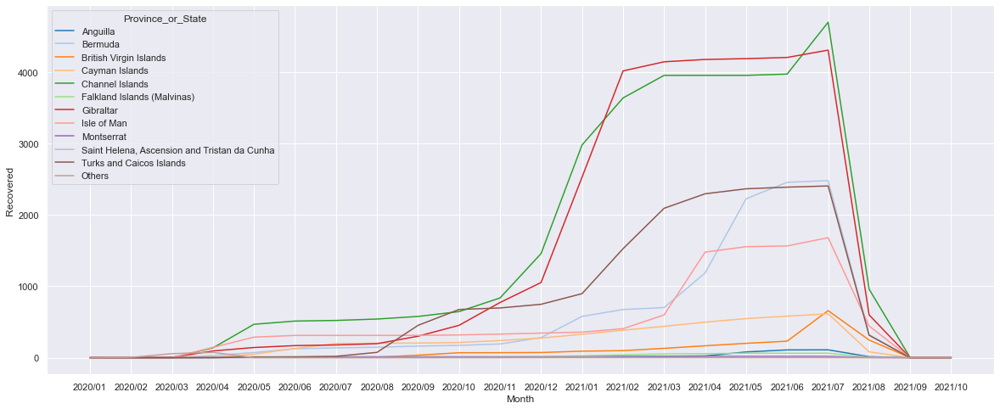

In [297]:
# Creating a lineplot to visualise the trend of recovered cases across the months.
custom_palette = sns.color_palette("tab20", 12)
sns.lineplot(x='Month', y='Recovered', data=new_recov_df, hue='Province_or_State', ci=None, palette=custom_palette)
sns.set(rc={'figure.figsize':(20,8)})

#### Observations
- Gibraltar: 
    - This has the steepest rate of rise of Recovered cases. This steep recovery takes place between 2020/12 and 2020/02. It follows a similar trend to the steep incline seen by Gibraltar in the Deaths dataset.
- Channel Islands:
    - Although generally the lineplot here is similar to that seen in Deaths, there are slight variations:
        - For example, the rate of increase between 2020/03 and 2020/04 is shorter and much less steeper, and the rate of Recovered cases slow down one month before rate of Deaths cases slows down (2020/05 vs 2020/06).
- Judging based on the top 2 highest Recovered cases:
    - The lineplot for the Recovered dataset look very similar to the lineplot for Deaths dataset, however the peaks differ by 3 months; For Gibraltar and Channel Islands, the recovered cases hit their peak in 2021/07, whereas the death cases hit their peak in 2021/10.
    - One potential cause for this lag in the Deaths dataset could be caused by the lag in deaths caused by the delay in time it took for a patient to become critically ill, and also the time it took to actually report the deaths. [source: https://covidtracking.com/analysis-updates/how-lagging-death-counts-muddied-our-view-of-the-pandemic].

#### Room for improvement (initial thoughts)
- Other datasets I could have explored alongside the Recovered lineplot, and the Deaths lineplot are:
    - Lineplot to measure the trend of (fully) Vaccinated individuals across the months.
        - It would be interesting to observe the impact that this had on Recovered cases and Deaths cases.
    - Lineplot to measure the trend of individuals who have only had their first doses across the months. 
        - I assume the actual impact would be better observed by analysing the earlier months of the first doses data, as it is not affected as heavily by the fully vaccinated individuals. 

### Hospitalised data

In [318]:
# Grouping data by Province/State, aggregating the sum of hospitalised cases, 
# and sorting the values of recovered cases in ascending order.
Hospitalised = cov_vacc_merge2.groupby("Province_or_State")[["Hospitalised"]]\
            .sum()\
            .sort_values("Hospitalised", ascending=True)

Hospitalised.reset_index()

,Province_or_State,Hospitalised
0,"Saint Helena, Ascension and Tristan da Cunha",259773.0
1,Others,285768.0
2,Bermuda,311547.0
3,Turks and Caicos Islands,337710.0
4,Channel Islands,363690.0
5,Cayman Islands,389669.0
6,Falkland Islands (Malvinas),415650.0
7,Isle of Man,467605.0
8,Anguilla,545540.0
9,British Virgin Islands,571506.0


In [319]:
# Creating a new DataFrame with only the 'Province_or_State', 'Month', and 'Hospitalised' columns.
new_hosp_df = cov_vacc_merge2[['Province_or_State','Month', 'Hospitalised']].copy()

new_hosp_df.dtypes

Province_or_State     object
Month                 object
Hospitalised         float64
dtype: object

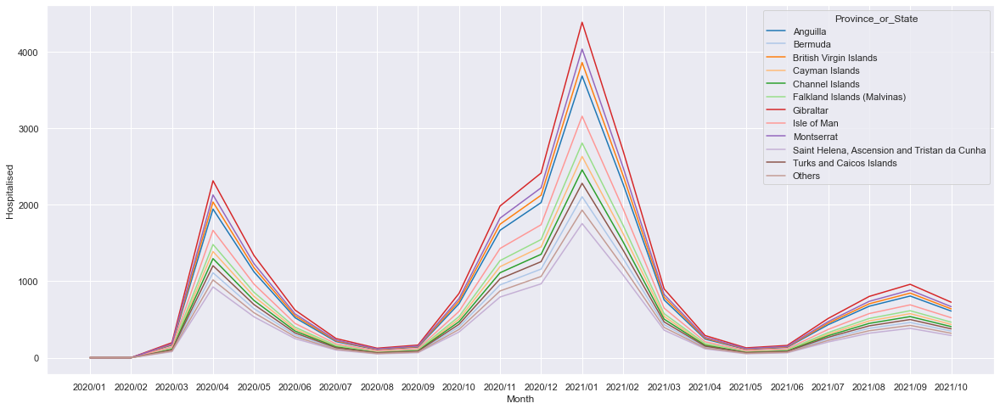

In [320]:
# Creating a lineplot to visualise the trend of recovered cases across the months.
custom_palette = sns.color_palette("tab20", 12)
sns.lineplot(x='Month', y='Hospitalised', data=new_hosp_df, hue='Province_or_State', ci=None, palette=custom_palette)
sns.set(rc={'figure.figsize':(20,8)})

#### Observations
- Every region reached it's highest peak number of hospitalisation cases in 2021/01. 
- The initial peak of every region was reached in 2020/04, and the most recent peak was reached in 2021/10.
- All regions have had 3 distinct peaks.
- Gibraltar has consistently had the highest number of hospitalisation every month compared to all other regions, followed by Montserrat, and British Virgin Islands.
- Although the death rate was very high for Channel Islands, it ranks 6th (highest being ranking 1st) in terms of hospitalisation.

## Tweets Analysis

### Initial analysis

In [298]:
# Displaying first 5 rows of tweets.
tweets.head()

,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str
0,23/05/2022,1.528750e+18,1.528750e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
1,23/05/2022,1.528720e+18,1.528720e+18,#COVID19 is linked to more #diabetes diagnoses...,False,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,False,NaN,NaN
2,23/05/2022,1.528650e+18,1.528650e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
3,23/05/2022,1.528610e+18,1.528610e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
4,23/05/2022,1.528600e+18,1.528600e+18,Advanced healthcare at your fingertips\nhttps:...,False,"<a href=""https://about.twitter.com/products/tw...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN


In [299]:
# Displaying last 5 rows of tweets.
tweets.tail()

,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str
3955,19/05/2022,1.527280e+18,1.527280e+18,NORTHERN IRELAND. Announced on THURSDAY.\n\nC...,False,"<a href=""http://twitter.com/#!/download/ipad"" ...",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,False,NaN,NaN
3956,18/05/2022,1.526910e+18,1.526910e+18,NORTHERN IRELAND. Announced on WEDNESDAY.\n\n...,False,"<a href=""http://twitter.com/#!/download/ipad"" ...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
3957,17/05/2022,1.526550e+18,1.526550e+18,NORTHERN IRELAND. Announced on TUESDAY.\n\nCO...,False,"<a href=""http://twitter.com/#!/download/ipad"" ...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
3958,16/05/2022,1.526190e+18,1.526190e+18,NORTHERN IRELAND. Announced on MONDAY.\n\nCOV...,False,"<a href=""http://twitter.com/#!/download/ipad"" ...",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,False,NaN,NaN
3959,15/05/2022,1.525900e+18,1.525900e+18,NORTHERN IRELAND. \n\nNI #COVID19 data has ...,False,"<a href=""http://twitter.com/#!/download/ipad"" ...",NaN,NaN,NaN,NaN,...,NaN,False,1,0,False,False,en,False,NaN,NaN


In [71]:
# Determining shape, data type, and concise summary of tweets data set.
print(tweets.shape)
print(tweets.dtypes)
print(tweets.info())

(3960, 21)
created_at                    object
id                           float64
id_str                       float64
text                          object
truncated                     object
source                        object
in_reply_to_status_id        float64
in_reply_to_status_id_str    float64
in_reply_to_user_id          float64
in_reply_to_user_id_str      float64
in_reply_to_screen_name      float64
contributors                 float64
is_quote_status               object
retweet_count                  int64
favorite_count                 int64
favorited                     object
retweeted                     object
lang                          object
possibly_sensitive            object
quoted_status_id             float64
quoted_status_id_str         float64
dtype: object
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3960 entries, 0 to 3959
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     ---

#### Observations
- There is one missing data in columns: 'created_at', 'id', 'id_str', 'text', 'truncated', 'source', 'is_quote_status', 'favorited', 'retweeted', 'lang'.
- There are 830 missing data in column: 'possibly_sensitive'.
- There are 3960 missing data in columns: 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id', 'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'contributors', 'quoted_status_id', 'quoted_status_id_str'.

In [300]:
# Number of rows with missing data.
tweets_na = tweets[tweets.isna().any(axis=1)]

print(tweets_na.shape)

# Printing the rows containing missing data.
tweets_na

(3960, 21)


,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str
0,23/05/2022,1.528750e+18,1.528750e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
1,23/05/2022,1.528720e+18,1.528720e+18,#COVID19 is linked to more #diabetes diagnoses...,False,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,False,NaN,NaN
2,23/05/2022,1.528650e+18,1.528650e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
3,23/05/2022,1.528610e+18,1.528610e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
4,23/05/2022,1.528600e+18,1.528600e+18,Advanced healthcare at your fingertips\nhttps:...,False,"<a href=""https://about.twitter.com/products/tw...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
5,23/05/2022,1.528590e+18,1.528590e+18,Deciphering ADA 2021: Minimize Risks for Peopl...,False,"<a href=""https://social.zoho.com"" rel=""nofollo...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
6,23/05/2022,1.528560e+18,1.528560e+18,It can’t really be called a pandemic when less...,False,"<a href=""http://twitter.com/download/android"" ...",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,NaN,NaN,NaN
7,23/05/2022,1.528540e+18,1.528540e+18,Out of the hospital from DKA.. now I tested po...,False,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,NaN,NaN,NaN
8,22/05/2022,1.530000e+18,1.528490e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
9,22/05/2022,1.528480e+18,1.528480e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN


#### Observations
- As expected from previous analysis, all 3960 rows were printed.

### Hashtag Analysis

In [302]:
# Creating new DataFrame with only the text values.
tweets_new = tweets[['text']].copy()

tweets_new

,text
0,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
1,#COVID19 is linked to more #diabetes diagnoses...
2,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
3,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
4,Advanced healthcare at your fingertips\nhttps:...
5,Deciphering ADA 2021: Minimize Risks for Peopl...
6,It can’t really be called a pandemic when less...
7,Out of the hospital from DKA.. now I tested po...
8,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
9,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...


In [305]:
"""
str.extractall() allows me to extract all the hashtags from a column, and displays each of the matches into a new row.
Note: I am using str.extractall() as it doesn't just return the first match per column back to me like str.extract()
"""
tweets_extract = tweets_new.text.str.extractall(r'(\#\w+)')[0].value_counts()
tweets_extract

#COVID19                                       1981
#CovidIsNotOver                                 631
#China                                          376
#coronavirus                                    216
#covid19                                        198
#Covid19                                        187
#COVID                                          138
#Greece                                         134
#Shanghai                                       108
#covid                                          107
#monkeypox                                      102
#Omicron                                         94
#Athens                                          86
#CoronaUpdate                                    84
#PeoplesVaccine                                  84
#COVID2020                                       82
#COVID19Pandemic                                 81
#CoronavirusOutbreak                             80
#covid19uk                                       80
#globalhealt

In [308]:
# Converting tweets_extract into a DataFrame, and resetting the index.
tweets_df = pd.DataFrame(tweets_extract).reset_index()

# Displaying 30 records.
tweets_df.head(30)

,index,0
0,#COVID19,1981
1,#CovidIsNotOver,631
2,#China,376
3,#coronavirus,216
4,#covid19,198
5,#Covid19,187
6,#COVID,138
7,#Greece,134
8,#Shanghai,108
9,#covid,107


In [311]:
# Renaming columns.
tweets_df = tweets_df.rename(columns={'index': 'hashtags', 0:'count'})

tweets_df.head(1)

,hashtags,count
0,#COVID19,1981


In [312]:
tweets_df.dtypes

hashtags    object
count        int64
dtype: object

In [313]:
# Retrieving the top 30 hashtags from the tweets.
hashtags = tweets_df.head(30)

hashtags

,hashtags,count
0,#COVID19,1981
1,#CovidIsNotOver,631
2,#China,376
3,#coronavirus,216
4,#covid19,198
5,#Covid19,187
6,#COVID,138
7,#Greece,134
8,#Shanghai,108
9,#covid,107


In [314]:
# Filtering the hashtags which have a count above or equal to 100.
hashtags_filtered = hashtags.loc[(df1['count']>=100)]

hashtags_filtered

,hashtags,count
0,#COVID19,1981
1,#CovidIsNotOver,631
2,#China,376
3,#coronavirus,216
4,#covid19,198
5,#Covid19,187
6,#COVID,138
7,#Greece,134
8,#Shanghai,108
9,#covid,107


In [315]:
# Removing #monkeypox as it is not relevant to COVID.
hashtag_removed = hashtags_filtered.drop(df2.index[[10]])

hashtag_removed

,hashtags,count
0,#COVID19,1981
1,#CovidIsNotOver,631
2,#China,376
3,#coronavirus,216
4,#covid19,198
5,#Covid19,187
6,#COVID,138
7,#Greece,134
8,#Shanghai,108
9,#covid,107


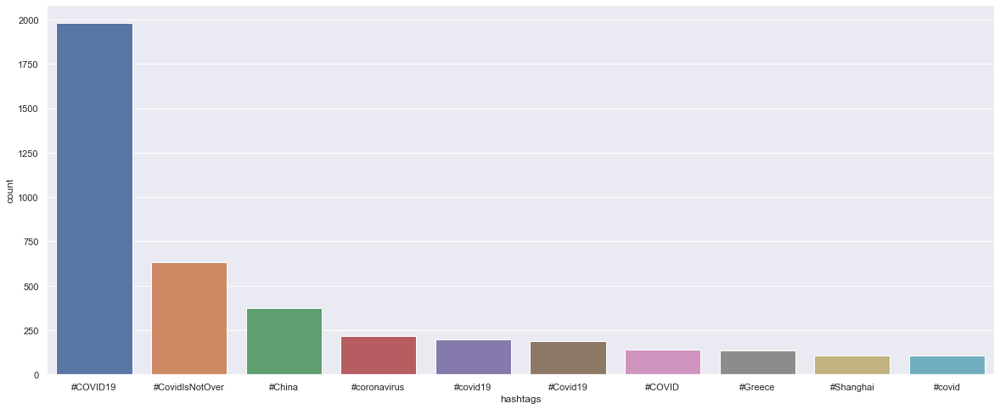

In [316]:
# Visualising the data above.
graph = sns.barplot(x='hashtags',y='count', data=hashtag_removed)

#### Observations
- #COVID19 is the most popular hashtag, and takes the lead compared to all the other hashtags.
- Thus marketing campaigns would spread further if #COVID19 was used.
- It would have been interesting to incorporate live data, as the hashtags data would have been observed live, thus trending hashtags relating to COVID19 may have changed, and the marketing team in charge of marketing campaigns could have altered their hashtags to suit and adapt to changing trends on social media.

# Performing time-series analysis

In [335]:
# Libraries and settings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from github.MainClass import Github
import requests
import json

%matplotlib inline

In [336]:
# Load and select relevant subset of the data
# Make sure to change the relative path to function in your environment

ds1 = pd.read_csv('https://raw.githubusercontent.com/Maduraa96/LSE_DA_COVID_analysis/main/covid_19_uk_cases.csv')
ds2 = pd.read_csv('https://raw.githubusercontent.com/Maduraa96/LSE_DA_COVID_analysis/main/covid_19_uk_vaccinated.csv')

sample = ds1[['Province/State','Date','Hospitalised']]

In [337]:
# Select data for a specific province
sample_ci = sample[sample['Province/State'] == "Channel Islands"]
sample_ci

,Province/State,Date,Hospitalised
2528,Channel Islands,2020-01-22,0.0
2529,Channel Islands,2020-01-23,0.0
2530,Channel Islands,2020-01-24,0.0
2531,Channel Islands,2020-01-25,0.0
2532,Channel Islands,2020-01-26,0.0
2533,Channel Islands,2020-01-27,0.0
2534,Channel Islands,2020-01-28,0.0
2535,Channel Islands,2020-01-29,0.0
2536,Channel Islands,2020-01-30,0.0
2537,Channel Islands,2020-01-31,0.0


In [338]:
# Define function to plot moving averages
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):
    
    # Create a rolling window to calculate the rolling mean using the series.rolling function
    rolling_mean = series.rolling(window=window).mean()
    
    # Declare the dimensions for the plot, plot name and plot the data consisting of the rolling mean from above 
    plt.figure(figsize=(18,4))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Simple moving average trend')

    
    # Plot confidence intervals for smoothed values
    if plot_intervals:
        
        # Calculate the mean absolute square 
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        
        # Calculate the standard deviation using numpy's std function
        deviation = np.std(series[window:] - rolling_mean[window:])
        
        # Calculate the upper and lower bounds 
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        
        # Name and style upper and lower bound lines and labels 
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
    
    # Plot the actual values for the entire timeframe
    plt.plot(series[window:], label='Actual values')
    plt.grid(True)

In [339]:
# Define function to calculate the mean absolute error
def mean_absolute_error(a, b): return abs(b - a)

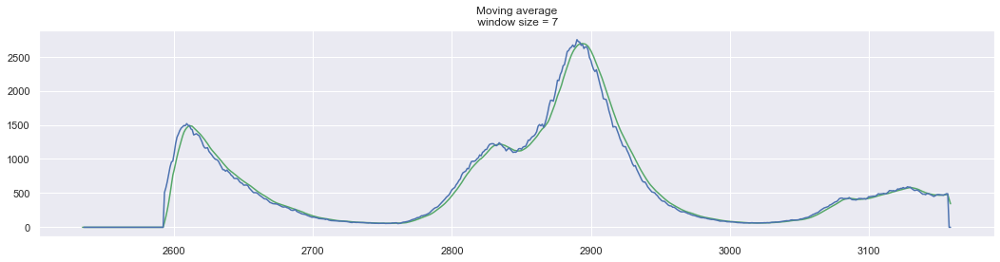

In [340]:
# Demonstrate the use of the function to plot moving averages

"""
Creating a new data frame that only consists of the hospitalised column.
This is because the rolling function only takes specific columns from DataFrames.
Plot intervals and scale have already been stated within the function.
"""
# Only entering the arguments into the function.
plot_moving_average(sample_ci.Hospitalised, 7)


In [341]:
# Return the top three days with biggest difference between daily value and rolling 7-day mean
s = sample_ci.copy()
s_rolling = s['Hospitalised'].rolling(window=7).mean()
s['error'] = mean_absolute_error(s['Hospitalised'][7:], s_rolling[7:])
s.sort_values('error', ascending=False).head(3)

,Province/State,Date,Hospitalised,error
2593,Channel Islands,2020-03-27,509.0,436.285714
2594,Channel Islands,2020-03-28,579.0,423.571429
2595,Channel Islands,2020-03-29,667.0,416.285714


This code provides insight into the mean absolute error between the hospitalised data and the rolling mean.
It is the average of 7 absolute errors, where absolute error = absolute value of (hospitalised data - rolling mean)/n,
where n=7. 
It gives an indication of how far away the actual hospitalised data is from the rolling mean calculated in question 1.

In question 1, we were asked to plot the rolling mean - which gives an insight into the trends seen every 7 days. 
Thus the above code is to decipher how far off the actual data is to the trends.

#### Question 3.1 (double click cell to edit)
- What is the difference between qualitative and quantitative data? How can these be used in business predictions?

Qualitative data is descriptive data and is more conceptual. It focuses on the why, and illustrates the characteristics or qualities of a dataset. For example, analysis made through an interview. In our case, it'll be the twitter analysis, whereby hashtags were initially retrieved from the texts in the twitter dataset for analysis.

Quantitative data involves analysing data that is based on numbers, and so is measurable. For example, in our dataset, the number of cases measured everyday from January 2020, to October 2021 is quantitave data.

Forecasting based on Quantitave data uses current, existing data to predict how trends will change and evolve with time. It relies on facts to predict the path the business is most likely to take.

Forecasting based on Qualitative data allows businesses to make future predictions through analysing it's consumer behaviour. This includes analysis on consumers current opinions on topics, trending ideas on topics (for example, vaccine misinformation being more prevalant in certain countries than other countries). 

#### Question 3.2 (double click cell to edit)
- Can you provide you observations around why continuous improvement is required, can we not just implement the project and move on to other pressing matters?

Continuous improvement is a philosophy adapted by many companies. It's based around the idea that perfectionism does not exist within the business world (soource: https://blog.datumize.com/how-big-data-fosters-a-culture-of-continuous-improvement-logistics), especially in data analytics where the desired result from an analysis may not always be possible. You can always continuously keep improving on things, making strategies and methodology more efficient, and finding better ways of doing things. Additionally, this principle enables individuals to build a healthier, more positive mindset, whereby the individual recognises good work is great work, and improvements are always possible every step of the way. 

#### Question 3.3 (double click cell to edit)
- As a government, we adhere to all data protection requirements and have good governance in place. Does that mean we can ignore data ethics? We only work with aggregated data and therefore will not expose any personal details? (Provide an example of how data ethics could apply to this case; two or three sentences max)

Data ethics explores ethics associated with the moral principles behind data practices, as they can negatively impact individuals or society. Data ethics, in my opinion, should never be ignored. However, this does not mean organisations cannot work with aggregated data. For example, the aggregated data being analysed for this project is so vague it does not invade an individuals personal information and provides us only with a general overview of the data. 